In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/celeba-dataset/list_landmarks_align_celeba.csv
/kaggle/input/celeba-dataset/list_eval_partition.csv
/kaggle/input/celeba-dataset/list_attr_celeba.csv
/kaggle/input/celeba-dataset/list_bbox_celeba.csv
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/083648.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/168202.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/125778.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/059339.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/032501.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/160139.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/046754.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/178961.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/123482.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/039337.jpg
/kaggle/input/celeba-dataset/img_align_celeba/

In [2]:
import torch, os
import torchvision
import torchvision.datasets as datasets
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torchvision.utils as vutils
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import DataLoader


In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
#hyperparameters and constants
image_dim = 64 * 64 * 3
image_size = 64
batch_size = 32
z_dim = 100
IMAGE_PATH = '../input/celeba-dataset/img_align_celeba/'
lr = 0.0002
num_epochs = 10
LAMBDA_GP = 10

In [5]:
transform = transforms.Compose([
    #transforms.Scale(image_size),
    transforms.Resize((image_size, image_size)),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = ImageFolder(IMAGE_PATH, transform)
data_loader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, num_workers=0, drop_last=True)

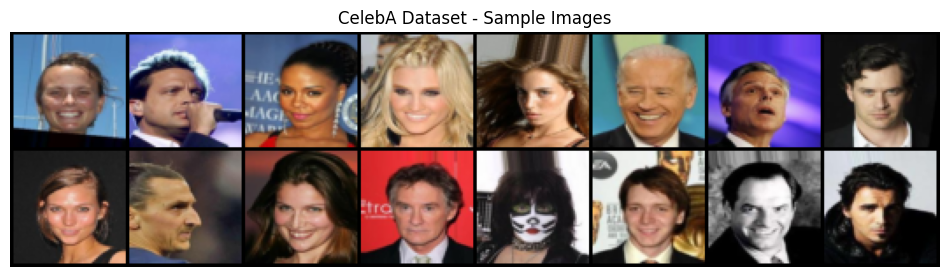

torch.Size([32, 3, 64, 64])


In [6]:

real_batch = next(iter(data_loader))
# Display the images
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.title("CelebA Dataset - Sample Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:16], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

print(real_batch[0].shape)

In [7]:
class Critic(nn.Module):
    def __init__(self, img_dim):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(0.1),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.1),
            nn.Flatten(),
            nn.Linear(256*8*8, 1),
        )
    def forward(self, x):
        return self.disc(x)
    

class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256*8*8),
            nn.Unflatten(1, (256, 8, 8)),  # Reshape to (batch_size, 256, 8, 8)
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),#(128, 16, 16)
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1),  
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),#(64, 32,32)
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),#(3,64,64)
            nn.Tanh(),  
        )
    def forward(self, x):
        return self.gen(x)
        

In [8]:
critic = Critic(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)

In [9]:
class WassersteinLoss(nn.Module):
    def __init__(self):
        super(WassersteinLoss, self).__init__()

    def forward(self, inputs, targets):
        loss = inputs * targets
        return -loss.mean()

In [10]:
def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    epsilon = torch.rand((BATCH_SIZE, 1, 1 ,1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * epsilon + fake * (1 - epsilon)

    #calculate critic score
    mixed_scores = critic(interpolated_images)
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]

    gradient = gradient.view(gradient.shape[0],-1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [11]:
opt_critic = optim.Adam(critic.parameters(),lr=lr, betas=(0.0, 0.9))
opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.0, 0.9))
criterion = WassersteinLoss()

In [12]:
def sample_images(epoch):
    noise = torch.randn(32, z_dim).to(device)
    sample_images = gen(noise)

    image_grid = vutils.make_grid(sample_images,
                              padding=2,
                              normalize=True).cpu()
    image_grid = np.transpose(image_grid, (1, 2, 0))

    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.title('Fake Images')

    plt.imshow(image_grid)
    plt.savefig(f"fake images of epoch {epoch}")

Epoch [0/10] Batch 0/6331                       Loss D: -23.4893, loss G: 16.3686
Epoch [1/10] Batch 0/6331                       Loss D: -8.7200, loss G: 9.6973
Epoch [2/10] Batch 0/6331                       Loss D: -4.7022, loss G: 4.0407
Epoch [3/10] Batch 0/6331                       Loss D: -4.2341, loss G: 15.4688
Epoch [4/10] Batch 0/6331                       Loss D: -7.7156, loss G: 3.4624
Epoch [5/10] Batch 0/6331                       Loss D: -5.1199, loss G: 7.7969
Epoch [6/10] Batch 0/6331                       Loss D: -3.3082, loss G: 26.8492
Epoch [7/10] Batch 0/6331                       Loss D: -0.3909, loss G: -31.2099
Epoch [8/10] Batch 0/6331                       Loss D: -3.8119, loss G: 8.8826
Epoch [9/10] Batch 0/6331                       Loss D: -3.5154, loss G: -7.4542


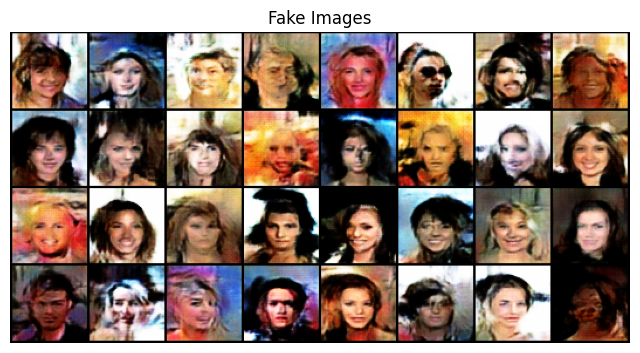

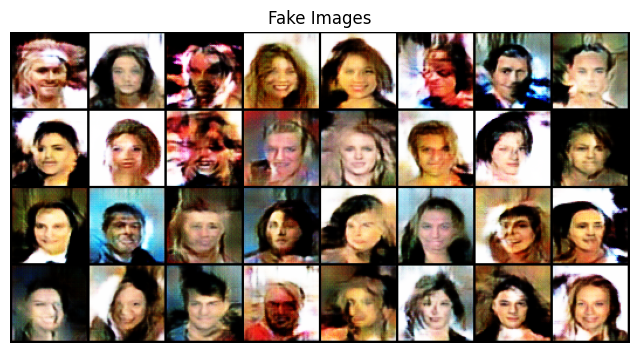

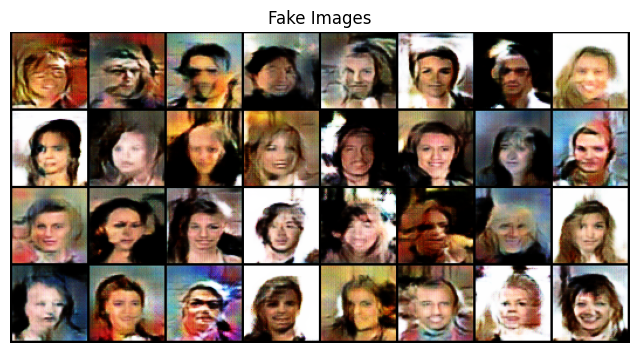

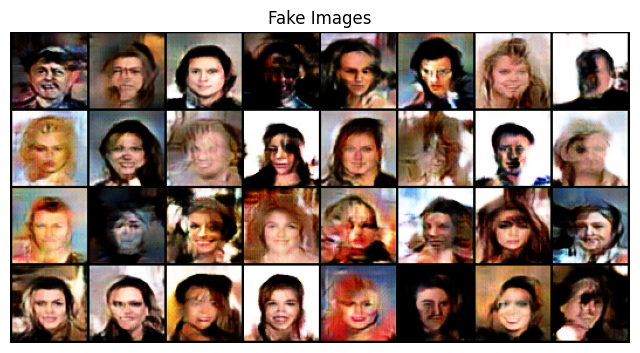

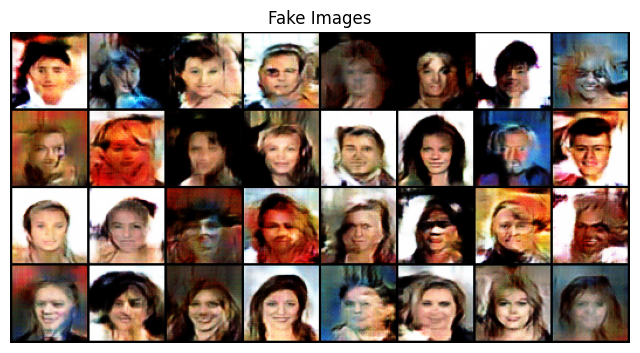

In [15]:
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(data_loader):
        real = real.view(-1, 3, 64, 64).to(device)
        #print(real.shape)
        #print("Real shape:", real.shape)
        batch_size = real.shape[0]

        #train discriminator max log(D(real)) + log(1-D(G(z)))
        for i in range(5):
            noise = torch.randn(batch_size, z_dim).to(device)
            fake = gen(noise)
            critic_real = critic(real).view(-1)
            #print("Discriminator output shape:", disc_real.shape)
            lossC_real = criterion(critic_real, torch.ones_like(critic_real))
            critic_fake = critic(fake.detach()).view(-1)
            lossC_fake = criterion(critic_fake, -torch.ones_like(critic_fake))
            gp = gradient_penalty(critic, real, fake, device=device)
            
            lossC = (lossC_fake + lossC_real) + LAMBDA_GP * gp
            critic.zero_grad()
            lossC.backward(retain_graph=True)
            opt_critic.step()

        #train Generator min log(1-D(G(z))) ->max log(D(G(z)))
        output = critic(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()
        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(data_loader)} \
                      Loss D: {lossC:.4f}, loss G: {lossG:.4f}"
            )
    if (epoch + 1) % 2 == 0:
      sample_images(epoch=epoch+1)

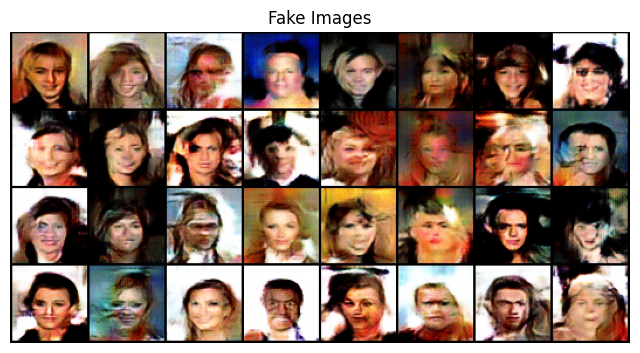

In [23]:
sample_images(epoch=11)